In [116]:
import pandas as pd
import numpy as np
from tqdm import tqdm
import plotly.express as px
from scipy.stats import ttest_ind
from sklearn.decomposition import PCA
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as hc
from scipy.spatial import distance
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import dash_bio
import statsmodels.api as sm

# set infinite display
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

# allow tqdm to chart pandas progress
tqdm.pandas()

## This notebook contains the pipeline and all of its constituent tools.

### The dataframes need some further processing before the pipeline can run on them.

In [2]:
# import the TPM dataframe for the majority of the pipeline
TPM = pd.read_csv('../../results/TPM.tsv', sep='\t', index_col=0)

### Processing the TPM dataframe for the statistical tools

In [3]:
# transpose the dataframe
TPM = TPM.T
# rename TPM index to read_group_id
TPM.index.names = ['read_group_id']
# turn the index into a column
TPM.reset_index(inplace=True)
# preview the dataframe only showing the first 10 columns
TPM.iloc[:, :10].head()

Name,read_group_id,ENST00000456328.2,ENST00000450305.2,ENST00000488147.1,ENST00000619216.1,ENST00000473358.1,ENST00000469289.1,ENST00000607096.1,ENST00000417324.1,ENST00000461467.1
0,16e72993-470f-4ac2-91fe-562c61615a59,0.068287,0.0,1.660365,0.0,0.000000,0.0,0.0,0.0,0.0
1,0a3c7dd6-cc30-416d-91f7-d91b22bbbff4,0.000000,0.0,2.053805,0.0,0.000000,0.0,0.0,0.0,0.0
2,a3a21562-3933-4e92-8ea4-70be74dc19fe,0.000000,0.0,3.124912,0.0,0.040398,0.0,0.0,0.0,0.0
3,baefbbf5-b891-4dd7-8be3-f6f28f0b24f7,0.000000,0.0,1.658161,0.0,0.000000,0.0,0.0,0.0,0.0
4,c1d7f3a1-350b-4e57-a02d-4313e4beabe4,0.000000,0.0,0.948201,0.0,0.000000,0.0,0.0,0.0,0.0


In [4]:
# sum of TPM values for each transcript
TPM_sum = TPM.iloc[:, 1:].sum(axis=0)

In [5]:
# remove all rows in TPM_sum that have values below the 95th percentile
TPM_sum_threshold = TPM_sum[TPM_sum > TPM_sum.quantile(0.05)]

In [6]:
# compare shapes of the two dataframes
print(TPM_sum.shape)
print(TPM_sum_threshold.shape)

(252045,)
(239442,)


In [7]:
# Create a list of columns to keep
columns_to_keep = ['read_group_id'] + [col for col in TPM.columns[1:] if col in TPM_sum_threshold.index]

# Create a copy of TPM dataframe with only the desired columns
TPM_copy = TPM[columns_to_keep].copy()

In [8]:
# compare shapes of the two dataframes
print(TPM.shape)
print(TPM_copy.shape)

(888, 252046)
(888, 239443)


In [9]:
# make a TPM backup
TPM_backup = TPM.copy()
# replace TPM with TPM_copy
TPM = TPM_copy

In [10]:
#load metadata dataframe
metadata = pd.read_csv('../../results/metadata.tsv', sep='\t')
#preview the dataframe only showing the first 10 columns
metadata.iloc[:, :10].head()

,case_id,aliquot_id,read_group_id,has_blood_cancer,tissue_type,instrument_model,RIN,includes_spike_ins,library_preparation_kit_name,library_preparation_kit_vendor
0,5705efcc-b48f-435c-8a28-9e0d407ecadd,75ac0619-947a-427b-a53f-71e121a7ec8f,71894d8b-5210-44dc-aadc-a199d3843dd2,False,Tumor,Illumina HiSeq 4000,NaN,True,TruSeq Stranded Total RNA Library Prep Kit wit...,Illumina
1,5705efcc-b48f-435c-8a28-9e0d407ecadd,948c4d53-3d91-48a6-bec4-0cc96020e572,86774648-bb57-42c3-b835-9fb11b590d8b,False,Tumor,NaN,NaN,NaN,NaN,NaN
2,763e0702-8379-4b5e-95d1-a84f412c51e7,ce810e2e-4929-4bbc-95ff-6da493477391,c2980255-7c57-4b79-82a7-f77098ff164e,False,Tumor,Illumina HiSeq 4000,NaN,True,TruSeq Stranded Total RNA Library Prep Kit wit...,Illumina
3,763e0702-8379-4b5e-95d1-a84f412c51e7,33c921ea-b743-4d32-9c56-875de6028c71,8062c6e4-d501-4c91-ab02-f36f4e7fd387,False,Tumor,Illumina HiSeq 4000,NaN,True,TruSeq Stranded Total RNA Library Prep Kit wit...,Illumina
4,763e0702-8379-4b5e-95d1-a84f412c51e7,173c0d6a-bc67-4a72-b6d3-b2a411e24785,39c8b5e7-ac68-4009-ab82-e1ee495bdbd9,False,Normal,Illumina HiSeq 4000,NaN,True,TruSeq Stranded Total RNA Library Prep Kit wit...,Illumina


In [11]:
# Convert 'read_group_id' to the same data type in both DataFrames
metadata['read_group_id'] = metadata['read_group_id'].astype(str)

# Check if 'read_group_id' is present in TPM dataframe
if 'read_group_id' in TPM.columns:
    TPM['read_group_id'] = TPM['read_group_id'].astype(str)
    # Merge TPM and metadata DataFrames on read_group_id
    TPM = pd.merge(TPM, metadata[['case_id', 'read_group_id']], on='read_group_id', how='left')
else:
    print("read_group_id column not found in TPM dataframe")

In [12]:
#move case_ID to 1st column 
TPM = TPM[['case_id'] + [col for col in TPM.columns if col != 'case_id']]
#remove duplicate case_id's from TPM dataframe
TPM.drop_duplicates(subset='case_id', keep='first', inplace=True)
#sort by case_id
TPM.sort_values(by=['case_id'], inplace=True)
#remove read_group_id column
TPM.drop(columns=['read_group_id'], inplace=True)
# remove the . and everything after it from the transcript_id columns in the TPM dataframe
TPM.columns = [col.split('.')[0] for col in TPM.columns]
#preview first 10 columns of TPM dataframe
TPM.iloc[:, :10].head()

,case_id,ENST00000456328,ENST00000488147,ENST00000473358,ENST00000469289,ENST00000607096,ENST00000417324,ENST00000461467,ENST00000606857,ENST00000642116
157,020db2d3-bb73-46c7-89ea-4648e0d3f2cb,0.0,3.514290,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
311,0215c1e2-70aa-495b-a1f1-25bd989a9f12,0.0,2.866582,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
579,02208cc6-6221-4e84-bf66-2d32fb49a358,0.0,1.398049,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
576,022c3490-811c-4f82-ad9b-8004a3df7e5c,0.0,1.903676,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
584,026644c2-a548-4f0d-95bf-716c567f055c,0.0,3.724858,0.123148,0.053909,0.0,0.0,0.0,0.0,0.0


In [13]:
# do the same for TPM_backup

# Check if 'read_group_id' is present in TPM dataframe
if 'read_group_id' in TPM_backup.columns:
    TPM_backup['read_group_id'] = TPM_backup['read_group_id'].astype(str)
    # Merge TPM and metadata DataFrames on read_group_id
    TPM_backup = pd.merge(TPM_backup, metadata[['case_id', 'read_group_id']], on='read_group_id', how='left')
else:
    print("read_group_id column not found in TPM dataframe")

TPM_backup = TPM_backup[['case_id'] + [col for col in TPM_backup.columns if col != 'case_id']]
TPM_backup.drop_duplicates(subset='case_id', keep='first', inplace=True)
TPM_backup.sort_values(by=['case_id'], inplace=True)
TPM_backup.drop(columns=['read_group_id'], inplace=True)
TPM_backup.columns = [col.split('.')[0] for col in TPM_backup.columns]

### Selecting a subset of relevant metadata columns to make the query process easier.

In [14]:
# take tissue_type, gender, race, age_at_diagnosis, ajcc_pathologic_stage, primary_diagnosis, morphology, tissue_or_organ_of_origin, tumor_focality, disease_type, primary_site from the metadata and merge it with the TPM_pca_df into a new dataframe called TPM_pre_cluster
columns = ['case_id', 'tissue_type', 'gender', 'race', 'age_at_diagnosis', 'ajcc_pathologic_stage', 'primary_diagnosis', 'tissue_or_organ_of_origin', 'tumor_focality', 'disease_type', 'primary_site']
# Create a new dataframe with selected columns from metadata
selected_metadata = metadata[columns]
# remove duplicate case_id's from selected metadata dataframe
selected_metadata.drop_duplicates(subset='case_id', keep='first', inplace=True)
# preview the dataframe
selected_metadata.head()

,case_id,tissue_type,gender,race,age_at_diagnosis,ajcc_pathologic_stage,primary_diagnosis,tissue_or_organ_of_origin,tumor_focality,disease_type,primary_site
0,5705efcc-b48f-435c-8a28-9e0d407ecadd,Tumor,female,white,22142.0,Stage I,"Endometrioid adenocarcinoma, NOS",Corpus uteri,Unifocal,Adenomas and Adenocarcinomas,"Uterus, NOS"
2,763e0702-8379-4b5e-95d1-a84f412c51e7,Tumor,female,white,22179.0,Stage II,"Renal cell carcinoma, NOS","Kidney, NOS",Unifocal,Adenomas and Adenocarcinomas,Kidney
5,8710ce04-6b7f-4e37-adc0-0df1f2798b30,Tumor,male,asian,20772.0,Stage IB,"Adenocarcinoma, NOS","Lung, NOS",Unifocal,Adenomas and Adenocarcinomas,Bronchus and lung
7,c1898677-7a92-48cf-a09f-71d91c1cf8dc,Tumor,female,white,21979.0,Stage IIB,"Infiltrating duct carcinoma, NOS",Head of pancreas,Unifocal,Ductal and Lobular Neoplasms,Pancreas
8,e1d68cfb-04e7-43cb-b8c5-b523cf917636,Tumor,male,white,23545.0,Stage IVA,"Squamous cell carcinoma, NOS","Larynx, NOS",Unifocal,Squamous Cell Neoplasms,Other and ill-defined sites


### Loading the gene_name dictionaries.

In [15]:
with open('../../results/gene_to_transcript_mapping.pkl', 'rb') as file:
    gene_to_transcript_mapping = pickle.load(file)
with open('../../results/transcript_to_gene_mapping.pkl', 'rb') as file:
    transcript_to_gene_mapping = pickle.load(file)

In [16]:
# load the paper dictionaries
with open('../../results/paper_genes_to_transcripts.pkl', 'rb') as file:
    paper_gene_to_transcript_mapping = pickle.load(file)
with open('../../results/paper_transcript_to_gene_mapping.pkl', 'rb') as file:
    paper_transcript_to_gene_mapping = pickle.load(file)

In [17]:
# add the two dictionaries together
gene_to_transcript_mapping = {**gene_to_transcript_mapping, **paper_gene_to_transcript_mapping}
transcript_to_gene_mapping = {**transcript_to_gene_mapping, **paper_transcript_to_gene_mapping}

## This is where we define the pipeline functions. Later on, these will be moved to python scripts and an argument parser will be built to control their execution from a CLI.

In [18]:
# create a dataframe called selected_metadata_subset which only has case IDs present in TPM
selected_metadata_subset = selected_metadata[selected_metadata['case_id'].isin(TPM['case_id'])]
# print the shape of the dataframe
print(selected_metadata_subset.shape)
# print shape of TPM dataframe
print(TPM.shape)

(792, 11)
(792, 239443)


In [19]:
# if primary_diagnosis is blank, replace it with Unknown
selected_metadata_subset['primary_diagnosis'].fillna('Unknown', inplace=True)

In [20]:
# if tissue type is Tumor, primary site is Uterus, NOS, and primary diagnosis is blank, replace primary diagnosis with Endometrioid adenocarcinoma, NOS
selected_metadata_subset.loc[(selected_metadata_subset['tissue_type'] == 'Tumor') & (selected_metadata_subset['primary_site'] == 'Uterus, NOS') & (selected_metadata_subset['primary_diagnosis'] == 'Unknown'), 'primary_diagnosis'] = 'Endometrioid adenocarcinoma, NOS'

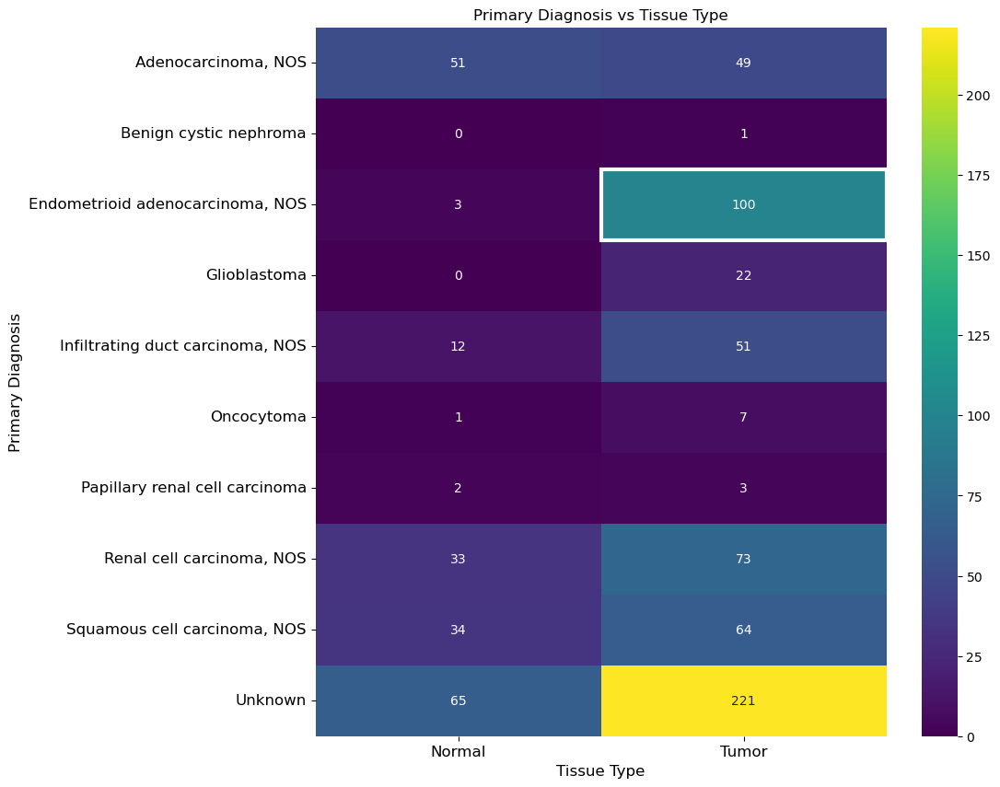

In [21]:
# Create a cross-tabulation of primary diagnosis and tissue type
cross_tab = pd.crosstab(selected_metadata_subset['primary_diagnosis'], selected_metadata_subset['tissue_type'], dropna=False)

# Plot the heatmap
plt.figure(figsize=(10, 10))
ax = sns.heatmap(cross_tab, cmap='viridis', annot=True, fmt='d', cbar=True)

# Calculate the number of rows and columns in the cross-tabulation
num_rows, num_cols = cross_tab.shape

# Create a green rectangle
# Adjust the y-coordinate by subtracting it from the number of rows
# Subtract 1 from the x-coordinate and the y-coordinate because matplotlib's coordinates are 0-based
rect = plt.Rectangle((num_cols - 1, num_rows - 8), 1, 1, fill=False, color='white', lw=3)
# increase font size
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
# increase font size for axis labels
plt.xlabel('Tissue Type', fontsize=12)
plt.ylabel('Primary Diagnosis', fontsize=12)

# Add the rectangle to the plot
ax.add_patch(rect)

# Refresh plot
plt.draw()

plt.title('Primary Diagnosis vs Tissue Type')
plt.show()


## Pipeline

In [131]:
def modded_query_maker(dataframe, TPM_dataframe):
    # print the column names, except for the first column
    print(dataframe.columns[1:])
    # use Endometrial Adenocarcinoma, NOS and tissue_type to subset the dataframe
    dataframe1 = dataframe.loc[(dataframe['primary_diagnosis'] == 'Endometrioid adenocarcinoma, NOS')]
    dataframe1 = dataframe1.loc[(dataframe1['tissue_type'] == 'Tumor')]
    #dataframe2 = dataframe.loc[(dataframe['primary_diagnosis'] != 'Endometrioid adenocarcinoma, NOS')]
    dataframe2 = dataframe.loc[(dataframe['tissue_type'] == 'Normal')]
    # use the case_id column to subset the TPM dataframe
    TPM_dataframe1 = TPM_dataframe[TPM_dataframe['case_id'].isin(dataframe1['case_id'])]
    TPM_dataframe2 = TPM_dataframe[TPM_dataframe['case_id'].isin(dataframe2['case_id'])]
    # print the shape of the two dataframes
    print('Dataframe 1 shape: ', TPM_dataframe1.shape)
    print('Dataframe 2 shape: ', TPM_dataframe2.shape)

    # PCA denovo
    # stack the TPM dataframes
    TPM_pca = pd.concat([TPM_dataframe1, TPM_dataframe2])
    # turn the first column into the index
    TPM_pca.set_index('case_id', inplace=True)
    # introduce pseudocount
    TPM_pca = TPM_pca + 0.000000001
    # perform log-transformation
    TPM_pca = TPM_pca.progress_apply(np.log2)
    # perform PCA
    pca = PCA(n_components=2, whiten=True)
    pca.fit(TPM_pca)
    # transform the data
    TPM_pca_fit = pca.transform(TPM_pca)
    # create a dataframe with the PCA results
    PCA_dataframe = pd.DataFrame(data = TPM_pca_fit, columns = ['PC1', 'PC2'], index=TPM_pca.index)

    # use the case_ids in dataframe1 to add a column to the PCA dataframe
    PCA_dataframe['group'] = PCA_dataframe.index.isin(dataframe1['case_id'])
    # if the group column contains True, set it to 'cohort', otherwise set it to 'control'
    PCA_dataframe['group'] = PCA_dataframe['group'].map({True: 'Cohort', False: 'Control'})
    # also generate a 2D PCA plot
    fig = px.scatter(PCA_dataframe, x='PC1', y='PC2', color='group', labels={'group': 'Group'}, title=f'PCA plot of Endometrioid Adenocarcinoma, cohort vs control')
    fig.show()
    # return the two dataframes
    return TPM_dataframe1, TPM_dataframe2

def ttester(gene_dict, title_table, df1, df2, alpha=0.05):
    # Remove the first columns from the dataframes
    df1 = df1.iloc[:, 1:]
    df2 = df2.iloc[:, 1:]
    
    # Run a t-test on each column
    ttest_results = df1.progress_apply(lambda x: ttest_ind(x, df2.loc[:, x.name]))

    # Calculate mean TPM for each gene across samples
    mean_TPM_gene1 = df1.mean(axis=0) + 0.000000001
    mean_TPM_gene2 = df2.mean(axis=0) + 0.000000001

    # Compute log fold change
    log2fc_tpm = {}
    for col in mean_TPM_gene1.index:
        log2fc_tpm[col] = np.log2(mean_TPM_gene1[col] / mean_TPM_gene2[col])
    
    # Create a DataFrame for the results
    ttest_df = pd.DataFrame({
        # 'transcript_id' will be the column names of ttest_results
        'transcript_id': ttest_results.columns,
        # 't_statistic' will be the first row of ttest_results
        't_statistic': ttest_results.iloc[0],
        # 'p_value' will be the second row of ttest_results
        'p_value': ttest_results.iloc[1],
        # somehow add log2fc_tpm to the dataframe
        'log2fc_tpm': [log2fc_tpm[col] for col in ttest_results.columns]
    })

    # reset the index of ttest_df
    ttest_df.reset_index(drop=True, inplace=True)
    
    # Adjust the significance level (alpha) based on the number of tests
    significance_level = alpha / len(ttest_df)

    # add column for adjusted p-value
    ttest_df['adjusted_p_value'] = ttest_df['p_value'] * len(ttest_df)
    # Identify the statistically significant tests after Bonferroni correction
    ttest_df['significant'] = ttest_df['p_value'] < significance_level

    ttest_df['gene_name'] = ttest_df['transcript_id'].map(gene_dict)
    ttest_df['gene_title'] = ttest_df['gene_name'].map(title_table)

    # Sort the dataframe by p-value
    ttest_df.sort_values(by='p_value', inplace=True)

    within_thresholds = ttest_df[(ttest_df['p_value'] < significance_level)]
    # p-value = -log10(p-value)
    within_thresholds['p_value'] = -np.log10(within_thresholds['p_value'])
    # Select points outside the specified thresholds
    outside_thresholds = ttest_df[(ttest_df['p_value'] >= significance_level)]
    # p-value = -log10(p-value)
    outside_thresholds['p_value'] = -np.log10(outside_thresholds['p_value'])

    # -log10(significance_level)
    log_significance_level = -np.log10(significance_level)

    # Plot scatter plot for points within the thresholds
    fig = px.scatter(within_thresholds, x='log2fc_tpm', y='p_value', hover_name='gene_name',
                     title='Endometrioid Adenocarcinoma, TAVS vs log2 FC')
    # Update layout
    fig.update_layout(
    title='Endometrioid Adenocarcinoma, Differentially Expressed Transcripts',
    xaxis_title='Differential Transcript Expression (log2 FC)',
    yaxis_title='log-10(p-value)'
    )

    # update color to green
    fig.update_traces(marker=dict(color='green'))
    # update size of points to 3
    fig.update_traces(marker=dict(size=3))
    # update to remove legend
    fig.update_layout(showlegend=False)
    
    fig.update_xaxes(title_text='Differential Transcript Expression (log2 FC)')
    fig.update_yaxes(title_text='-log10(p-value)')

    # Add scatter plot for points outside the thresholds
    fig.add_trace(go.Scatter(x=outside_thresholds['log2fc_tpm'], y=outside_thresholds['p_value'], mode='markers',
                             marker=dict(color='grey', size=3)))

    # add a horizontal line at the 95th percentile of euclidean_distance
    fig.add_hline(y=log_significance_level, line_dash='dot', line_color='black')
    # Add text annotation for the 95th percentile value on the left side of the horizontal line
    fig.add_annotation(text='',
                    x=-0.05,
                    y=log_significance_level,
                    xref="paper",
                    yref="y",
                    showarrow=False,
                    font=dict(size=12))

    # Show figure
    fig.show()

    # Count the number of significant transcripts
    significant_transcripts = ttest_df['significant'].sum()
    # Print the number of significant transcripts
    print('Significant transcripts (using ttests): ', significant_transcripts)
    # print head
    #print(ttest_df.head())
    return ttest_df

def modded_gene_aggregator(ttest_df, genemap, df1, df2, log_threshold, alpha=0.05):
    # Group by gene_name and find the index of the minimum p_value in each group
    idx = ttest_df.groupby('gene_name')['adjusted_p_value'].idxmin()
    idx = idx[~np.isnan(idx)]
    # Use the index to extract the corresponding rows from the original DataFrame
    gene_level_results_min = ttest_df.loc[idx, ['gene_name', 'p_value', 'adjusted_p_value', 'log2fc_tpm', 'significant', 'gene_title']]

    # Lists to accumulate data
    sums1 = []
    sums2 = []
    log2_fold_change = []

    # Iterate over genes
    for gene, transcripts in tqdm(genemap.items()):
        # Extract relevant columns from the TPM dataframe
        gene_data1 = df1[[transcript for transcript in transcripts if transcript in df1.columns]]
        gene_data2 = df2[[transcript for transcript in transcripts if transcript in df2.columns]]
        
        # Compute sums
        sum1 = gene_data1.sum(axis=1)
        sum1.name = gene
        sum2 = gene_data2.sum(axis=1)
        sum2.name = gene
        
        # Append sums to lists
        sums1.append(sum1)
        sums2.append(sum2)
        
        # Compute mean TPM for each gene
        mean1 = sum1.mean() + 0.000000001
        mean2 = sum2.mean() + 0.000000001
        
        # Compute log2 fold change
        log2_fold_change.append(np.log2(mean1 / mean2))

    # Concatenate sums to dataframes
    gene_counts_df1 = pd.concat(sums1, axis=1)
    gene_counts_df2 = pd.concat(sums2, axis=1)

    # Create a Series with 'gene_name' as the index
    gene_ttest_series = pd.Series(log2_fold_change, index=list(genemap.keys()), name='log2fc_tpm')

    # Run a t-test on each column
    gene_ttest_results = gene_counts_df1.progress_apply(lambda x: ttest_ind(x, gene_counts_df2.loc[:, x.name]))
    
    # Create a DataFrame for the results
    gene_ttest_df = pd.DataFrame({
        # 'transcript_id' will be the column names of ttest_results
        'gene_name': gene_ttest_results.columns,
        # 'p_value' will be the second row of ttest_results
        'p_value': gene_ttest_results.iloc[1],
        # somehow add log2fc_tpm to the dataframe
        'log2fc_tpm': [gene_ttest_series[col] for col in gene_ttest_results.columns]
    })

    # reset the index of ttest_df
    gene_ttest_df.reset_index(drop=True, inplace=True)
    
    # Adjust the significance level (alpha) based on the number of tests
    significance_level = alpha / len(gene_ttest_df)

    # add column for adjusted p-value
    gene_ttest_df['adjusted_p_value'] = gene_ttest_df['p_value'] * len(ttest_df)
    # Identify the statistically significant tests after Bonferroni correction
    gene_ttest_df['significant'] = gene_ttest_df['p_value'] < significance_level
    # add in the transcript level significance matched to the gene name
    gene_ttest_df['transcript_significant'] = gene_ttest_df['gene_name'].map(gene_level_results_min.set_index('gene_name')['significant'])

    lower_threshold = -log_threshold
    upper_threshold = log_threshold

    within_thresholds = gene_ttest_df[(gene_ttest_df['p_value'] < significance_level) & ((gene_ttest_df['log2fc_tpm'] <= lower_threshold) | (gene_ttest_df['log2fc_tpm'] >= upper_threshold))]
    # p-value = -log10(p-value)
    within_thresholds['p_value'] = -np.log10(within_thresholds['p_value'])
    # Select points outside the specified thresholds
    outside_thresholds = gene_ttest_df[(gene_ttest_df['p_value'] >= significance_level) | ((gene_ttest_df['log2fc_tpm'] > lower_threshold) & (gene_ttest_df['log2fc_tpm'] < upper_threshold) & (gene_ttest_df['p_value'] < significance_level))]
    # p-value = -log10(p-value)
    outside_thresholds['p_value'] = -np.log10(outside_thresholds['p_value'])

    outside_thresholds_green = outside_thresholds[(outside_thresholds['transcript_significant'] == True)]
    outside_thresholds_grey = outside_thresholds[(outside_thresholds['transcript_significant'] == False)]

    # -log10(significance_level)
    log_significance_level = -np.log10(significance_level)

    # Plot scatter plot for points within the thresholds
    fig = px.scatter(within_thresholds, x='log2fc_tpm', y='p_value', hover_name='gene_name')
    # Update layout
    fig.update_layout(
    title='Endometrioid Adenocarcinoma, Differentially Expressed Genes',
    xaxis_title='Differential Gene Expression (log2 FC)',
    yaxis_title='-log10(p-value)'
    )
    # update size of points to 3
    fig.update_traces(marker=dict(size=3))
    # update color of dots to red
    fig.update_traces(marker=dict(color='red'))
    # update to remove legend
    fig.update_layout(showlegend=False)

    # Add scatter plot for points outside the thresholds, with 'transcript_significant' as the color parameter
    fig.add_trace(go.Scatter(x=outside_thresholds_grey['log2fc_tpm'], y=outside_thresholds_grey['p_value'], mode='markers', marker=dict(color='grey', size=3)))
    fig.add_trace(go.Scatter(x=outside_thresholds_green['log2fc_tpm'], y=outside_thresholds_green['p_value'], mode='markers', marker=dict(color='green', size=3)))
    
    # Add horizontal lines for specified thresholds
    fig.add_vline(x=lower_threshold, line_dash='dot', line_color='black', name=f'Lower Threshold ({lower_threshold})')
    fig.add_vline(x=upper_threshold, line_dash='dot', line_color='black', name=f'Upper Threshold ({upper_threshold})')

    # add a horizontal line at the 95th percentile of euclidean_distance
    fig.add_hline(y=log_significance_level, line_dash='dot', line_color='black')
    # Add text annotation for the 95th percentile value on the left side of the horizontal line
    fig.add_annotation(text='',
                    x=-0.05,
                    y=log_significance_level,
                    xref="paper",
                    yref="y",
                    showarrow=False,
                    font=dict(size=12))
    
    # Show figure
    fig.show()

    # Sort the DataFrame by p-value
    gene_level_results_min.sort_values(by='p_value', inplace=True)
    # Resetting the index if needed
    gene_level_results_min.reset_index(drop=True, inplace=True)
    # Count the number of significant genes
    significant_genes = gene_level_results_min['significant'].sum()
    # Print the number of significant genes
    print('Significant genes: ', significant_genes)
    # Return the gene_level_results DataFrame
    return gene_level_results_min, gene_ttest_df

# def modded_visualizer(df1, df2, genemap, gene_level_results_max, gene_level_results_min):
def modded_visualizer(df1, df2, genemap, gene_level_results_min, gene_ttest_df, log_threshold):
    # remove the first columns from the dataframes
    df1 = df1.iloc[:, 1:]
    df2 = df2.iloc[:, 1:]

    results = []

    blank = 0
    for gene, transcripts in tqdm(genemap.items()):
        # Extract the relevant columns from the TPM dataframe
        gene_data1 = df1[[transcript for transcript in transcripts if transcript in df1.columns]]
        gene_data2 = df2[[transcript for transcript in transcripts if transcript in df2.columns]]
        # get sums
        sum1 = gene_data1.sum(axis=1)
        sum2 = gene_data2.sum(axis=1)
        # get vectors
        vector1 = gene_data1.sum(axis=0)
        vector2 = gene_data2.sum(axis=0)
        # get means
        mean1 = sum1.mean()
        mean2 = sum2.mean()
        # normalizing vectors using euclidean distance
        n_sum1 = np.linalg.norm(vector1)
        n_sum2 = np.linalg.norm(vector2)
        # get log 2 fold change
        if mean1 == 0 or mean2 == 0:
            log2_fold_change = np.nan
            blank += 1
        else:
            log2_fold_change = np.log2(mean1/mean2)
        # get vectors
        v_mean1 = vector1/n_sum1
        v_mean2 = vector2/n_sum2
        # get euclidean distance of mean vectors
        euclidean_distance = np.linalg.norm(v_mean1 - v_mean2)
        # add log2_fold_change and euclidean_distance to results
        results.append({'gene_name': gene, 'log2_fold_change': log2_fold_change, 'euclidean_distance': euclidean_distance})

    # Convert results to a DataFrame
    mean_df = pd.DataFrame(results)
    # Merge mean_df with gene_level_results_df
    mean_df_min = pd.merge(mean_df, gene_level_results_min[['gene_name', 'gene_title']], on='gene_name', how='left')
    # merge with gene_ttest_df
    mean_df_min = pd.merge(mean_df_min, gene_ttest_df[['gene_name', 'significant', 'transcript_significant']], on='gene_name', how='left')
    
    # print the number of blank log2_fold_change values
    print('Blank log2_fold_change values: ', blank)

    # add a column to mean_df_min that checks if euclidean distance is in the upper 5%
    mean_df_min['euclidean_distance_upper_quartile'] = mean_df_min['euclidean_distance'] > mean_df_min['euclidean_distance'].quantile(0.95)

    # Sort the DataFrame by the 'significant' column in descending order
    mean_df_min = mean_df_min.sort_values(by='significant', ascending=True)

    # Create a figure for the distribution
    fig, ax = plt.subplots(figsize=(8, 5))
    # Plot histogram for mean_df_min
    sns.histplot(data=mean_df_min, x='euclidean_distance', ax=ax, binwidth=0.025)
    ax.set_title('Endometrioid Adenocarcinoma\nPer-gene Transcript Abundance Variance Distribution')
    ax.set_xlabel('Per-gene Transcript Abundance Variance\n(Euclidean Distance)')
    # Calculate 95th percentile for mean_df_max
    percentile_95 = mean_df_min['euclidean_distance'].quantile(0.95)
    # Draw vertical line at 95th percentile
    ax.axvline(percentile_95, color='red', linestyle='--')
    # Display the euclidean distance value at the line
    ax.text(percentile_95, ax.get_ylim()[1]/2, f'     95th percentile: {percentile_95:.2f}', color='red', ha='left')
    plt.show()

    lower_threshold = -log_threshold
    upper_threshold = log_threshold

    # create a color column based on significant and transcript_significant; if significant is true, color is red, if transcript_significant is true, color is green, if both are true, color is blue, if both are false, color is grey
    mean_df_min['color'] = np.where((mean_df_min['significant'] == True) & ((mean_df_min['log2_fold_change'] >= upper_threshold) | (mean_df_min['log2_fold_change'] <= lower_threshold)), 'red', np.where(mean_df_min['transcript_significant'] == True, 'green', 'grey'))
    mean_df_min['log2_fold_change'] = abs(mean_df_min['log2_fold_change'])

    # Plot scatter plot for points within the thresholds
    fig = px.scatter(mean_df_min, x='log2_fold_change', y='euclidean_distance', hover_name='gene_name', color='color', color_discrete_map={'red': 'red', 'green': 'green', 'grey': 'grey'}, title='Endometrioid Adenocarcinoma, TAVS vs log2 FC')
    fig.update_xaxes(title_text='Differential Gene Expression (Absolute log2 FC)')
    fig.update_yaxes(title_text='Per-gene Transcript Abundance Variance Score')
    # update size of points to 3
    fig.update_traces(marker=dict(size=3))
    # remove the legend
    fig.update_layout(showlegend=False)

    regression = mean_df_min[['log2_fold_change', 'euclidean_distance']]
    # drop rows with NaN values
    regression = regression.dropna()

    # Perform OLS regression
    X = sm.add_constant(regression['log2_fold_change'])
    model = sm.OLS(regression['euclidean_distance'], X).fit()
    line_of_best_fit = model.predict(X)

    # Add the line of best fit to the plot
    fig.add_trace(go.Scatter(x=regression['log2_fold_change'], y=line_of_best_fit, mode='lines', name='Line of Best Fit'))

    # Add horizontal lines for specified thresholds
    fig.add_vline(x=upper_threshold, line_dash='dot', line_color='black', name=f'Upper Threshold ({upper_threshold})')

    # add a horizontal line at the 95th percentile of euclidean_distance
    fig.add_hline(y=mean_df_min['euclidean_distance'].quantile(0.95), line_dash='dot', line_color='black')
    # Add text annotation for the 95th percentile value on the left side of the horizontal line
    fig.add_annotation(text=f'{percentile_95:.2f}',
                    x=-0.04,
                    y=percentile_95,
                    xref="paper",
                    yref="y",
                    showarrow=False,
                    font=dict(size=12))

    # Show figure
    fig.show()

    # sort mean_df_min by euclidean_distance and reset index
    mean_df_min = mean_df_min.sort_values(by='euclidean_distance', ascending=False)
    mean_df_min.reset_index(drop=True, inplace=True)

    # return mean_df_max, mean_df_min
    return mean_df_min

## Specific Implementation Code

### setting up dictionaries

In [23]:
# import in GSE17025.top.table.tsv from data
top_table1 = pd.read_csv('../../data/GSE17025.top.table.tsv', sep='\t')
# import in GSE63678.top.table.tsv from data
top_table2 = pd.read_csv('../../data/GSE63678.top.table.tsv', sep='\t')
# import in GSE115810.top.table.tsv from data
top_table3 = pd.read_csv('../../data/GSE115810.top.table.tsv', sep='\t')
# preview the dataframe
top_table1.head()
# stack the dataframes on top of each other
top_table_x = pd.concat([top_table1, top_table2, top_table3])
# length of the dataframe
len(top_table_x)

99235

In [24]:
# isolate the Gene.symbol column
top_table = top_table_x['Gene.symbol']
# preview the dataframe
top_table.head()

0              AFDN-AS1
1                MAP3K1
2    PPAN-P2RY11///PPAN
3                  MAP6
4                  SDK2
Name: Gene.symbol, dtype: object

In [25]:
# only keep Gene.symbol and Gene.title columns
top_table_y = top_table_x[['Gene.symbol', 'Gene.title']]
# turn the table into a dictionary
top_table_dict = top_table_y.set_index('Gene.symbol')['Gene.title'].to_dict()

In [26]:
# find common entries between gene_to_transcript_mapping keys and top_table
common_genes = set(gene_to_transcript_mapping.keys()).intersection(set(top_table))
# print the number of common genes
print('Number of common genes: ', len(common_genes))

Number of common genes:  18025


In [27]:
# only keep common genes in gene_to_transcript_mapping
gene_to_transcript_mapping_common = {gene: gene_to_transcript_mapping[gene] for gene in common_genes}
# print the length of gene_to_transcript_mapping_common
print('Length of gene_to_transcript_mapping_common: ', len(gene_to_transcript_mapping_common))

Length of gene_to_transcript_mapping_common:  18025


### running the pipeline

In [28]:
# rerun the modded pipeline with the common genes
TPM_dataframe1, TPM_dataframe2 = modded_query_maker(selected_metadata_subset, TPM)

Index(['tissue_type', 'gender', 'race', 'age_at_diagnosis',
       'ajcc_pathologic_stage', 'primary_diagnosis',
       'tissue_or_organ_of_origin', 'tumor_focality', 'disease_type',
       'primary_site'],
      dtype='object')
Dataframe 1 shape:  (100, 239443)
Dataframe 2 shape:  (201, 239443)


100%|██████████| 239442/239442 [00:23<00:00, 10042.41it/s]


In [130]:
# run ttester to get a ttest_df
ttest_df = ttester(transcript_to_gene_mapping, top_table_dict, TPM_dataframe1, TPM_dataframe2, alpha=0.05)

100%|██████████| 239442/239442 [02:06<00:00, 1895.34it/s]


Significant transcripts (using ttests):  27961


In [160]:
# preview the dataframe
ttest_df.head()

,transcript_id,t_statistic,p_value,adjusted_p_value,significant,gene_name,gene_title
85626,ENST00000206249,17.011793,7.294711e-46,1.746660e-40,True,ESR1,estrogen receptor 1
111373,ENST00000376499,16.455088,9.109106e-44,2.181103e-38,True,TLE1,transducin like enhancer of split 1
85621,ENST00000338799,15.654715,9.281595e-41,2.222404e-35,True,ESR1,estrogen receptor 1
85628,ENST00000427531,15.349146,1.296655e-39,3.104737e-34,True,ESR1,estrogen receptor 1
85631,ENST00000482101,15.348284,1.306321e-39,3.127882e-34,True,ESR1,estrogen receptor 1


In [132]:
# run modded_gene_aggregator to get two gene_level_results_df
gene_level_results_min, gene_ttest_df = modded_gene_aggregator(ttest_df, gene_to_transcript_mapping_common, TPM_dataframe1, TPM_dataframe2, 1, alpha=0.05)

100%|██████████| 18025/18025 [00:11<00:00, 1515.60it/s]


Significant genes:  10673


In [84]:
# filter gene_level_results_min to only keep common genes
gene_level_results_min_common = gene_level_results_min[gene_level_results_min['gene_name'].isin(common_genes)]
# filter gene_ttest_df to only keep common genes
gene_ttest_df_common = gene_ttest_df[gene_ttest_df['gene_name'].isin(common_genes)]
# sort gene_level_results_min_common by p-value
gene_level_results_min_common.sort_values(by='p_value', inplace=True)
# reset the index
gene_level_results_min_common.reset_index(drop=True, inplace=True)
# preview the dataframe
gene_level_results_min_common.head(5)

,gene_name,p_value,adjusted_p_value,log2fc_tpm,significant,gene_title
0,ESR1,7.294711e-46,1.746660e-40,4.127781,True,estrogen receptor 1
1,TLE1,9.109106e-44,2.181103e-38,1.974975,True,transducin like enhancer of split 1
2,KLHL14,1.053598e-38,2.522755e-33,4.054462,True,kelch like family member 14
3,NR3C1,1.474489e-37,3.530547e-32,-2.246634,True,nuclear receptor subfamily 3 group C member 1
4,SOX17,2.458015e-35,5.885520e-30,4.280200,True,SRY-box 17


In [165]:
# length of gene_level_results_min_common
len(gene_level_results_min_common)

17992

100%|██████████| 18025/18025 [01:02<00:00, 287.78it/s]


Blank log2_fold_change values:  116


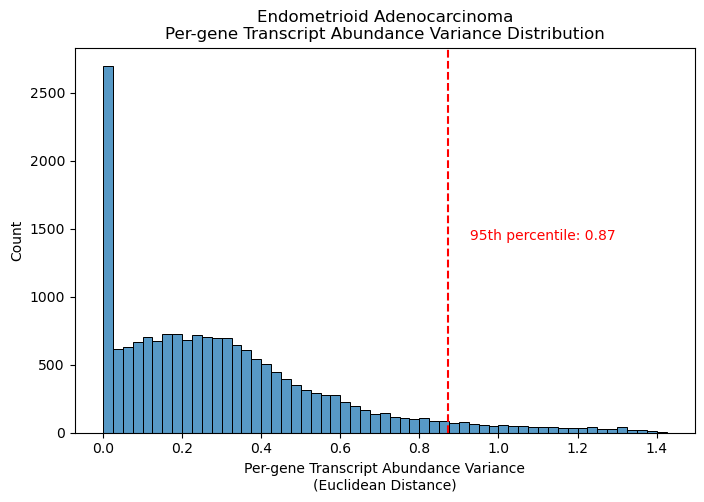

In [127]:
# continue with the modded pipeline
mean_df_min = modded_visualizer(TPM_dataframe1, TPM_dataframe2, gene_to_transcript_mapping_common, gene_level_results_min_common, gene_ttest_df_common, 1)

In [104]:
# counts of rows in mean_df_min of color red, green, grey
mean_df_min['color'].value_counts()

grey     8957
green    6200
red      2868
Name: color, dtype: int64

In [107]:
# count of rows with color green and euclidean distance in the upper quartile
mean_df_min[(mean_df_min['color'] == 'green') & (mean_df_min['euclidean_distance_upper_quartile'] == True)].shape

(93, 8)

In [168]:
# only keep significant genes
mean_df_min_sig = mean_df_min.loc[mean_df_min['significant'] == True]
# only keep genes with log2_fold_change greater than -1 and less than 1
mean_df_min_sig = mean_df_min_sig[(mean_df_min_sig['log2_fold_change'] > -1) & (mean_df_min_sig['log2_fold_change'] < 1)]
# sort mean_df_min by euclidean_distance
mean_df_min_sig.sort_values(by='euclidean_distance', ascending=False, inplace=True)
# reset the index
mean_df_min_sig.reset_index(drop=True, inplace=True)
# preview mean_df_min
mean_df_min_sig.head(10)

,gene_name,log2_fold_change,euclidean_distance,significant,gene_title,euclidean_distance_upper_quartile
0,LOXHD1,-0.539402,1.350556,True,lipoxygenase homology domains 1,True
1,AGTR1,-0.929810,1.316813,True,angiotensin II receptor type 1,True
2,FGFR3,0.807206,1.311609,True,fibroblast growth factor receptor 3,True
3,ADA,0.651304,1.295401,True,adenosine deaminase,True
4,MS4A6E,0.252544,1.292698,True,membrane spanning 4-domains A6E,True
5,CDK15,-0.010503,1.221091,True,cyclin dependent kinase 15,True
6,MGC16275,0.071858,1.166350,True,uncharacterized protein MGC16275,True
7,AQP6,0.201989,1.137719,True,aquaporin 6,True
8,KIF5A,-0.666452,1.117485,True,kinesin family member 5A,True
9,PIK3CD,-0.208564,1.109514,True,"phosphatidylinositol-4,5-bisphosphate 3-kinase...",True


In [171]:
mean_df_min_log = mean_df_min.loc[mean_df_min['significant'] == True]
# sort mean_df_min by log2_fold_change
mean_df_min_log.sort_values(by='log2_fold_change', inplace=True)
# preview the dataframe
mean_df_min_log.head()

/var/folders/n5/_h8qqt011vq0417yxq9kch240000gq/T/ipykernel_19181/4217677102.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,gene_name,log2_fold_change,euclidean_distance,significant,gene_title,euclidean_distance_upper_quartile
17363,TMSB4Y,-12.507188,0.000000,True,"thymosin beta 4, Y-linked",False
13178,SFTPC,-12.466566,0.105469,True,surfactant protein C,False
5840,SFTPB,-11.332307,0.371763,True,surfactant protein B,False
856,RPS4Y1,-10.614851,0.887769,True,"ribosomal protein S4, Y-linked 1",True
770,EIF1AY,-9.983077,0.914424,True,"eukaryotic translation initiation factor 1A, Y...",True


In [172]:
# sort mean_df_min by log2_fold_change in descending order
mean_df_min_log.sort_values(by='log2_fold_change', ascending=False, inplace=True)
# preview the dataframe
mean_df_min_log.head()

/var/folders/n5/_h8qqt011vq0417yxq9kch240000gq/T/ipykernel_19181/2008509020.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,gene_name,log2_fold_change,euclidean_distance,significant,gene_title,euclidean_distance_upper_quartile
17287,SCGB2A1,6.017243,0.000000,True,secretoglobin family 2A member 1,False
6470,FOXN4,5.442609,0.346035,True,forkhead box N4,False
15130,LGR5,5.232069,0.029344,True,leucine rich repeat containing G protein-coupl...,False
8216,CDC20B,5.224020,0.281830,True,cell division cycle 20B,False
6767,ALPP,5.029754,0.333550,True,"alkaline phosphatase, placental",False


In [173]:
# create symbol lists for the three tables
symbol1 = ['PEG3', 'HAND2-AS1', 'WT1', 'BCHE', 'OGN', 'TFAP2A', 'EPCAM', 'KRT18', 'PBK', 'MMP12']
symbol2 = ['FOSB', 'TRH', 'HAND2-AS1', 'PAX2', 'PEG3', 'TOP2A', 'CDC20B', 'ASPM', 'LTF', 'CCL20']
symbol3 = ['SFRP4', 'HAND2-AS1', 'FOXL2', 'EFEMP1', 'P2RY14', 'SLC7A5', 'CFB', 'SPP1', 'CP', 'TFF3']

In [175]:
# select out the symbol lists from the mean_df_min dataframe
mean_df_min1 = mean_df_min[mean_df_min['gene_name'].isin(symbol1)]
mean_df_min2 = mean_df_min[mean_df_min['gene_name'].isin(symbol2)]
mean_df_min3 = mean_df_min[mean_df_min['gene_name'].isin(symbol3)]
# print lengths
print(len(mean_df_min1))
print(len(mean_df_min2))
print(len(mean_df_min3))

10
10
10


In [176]:
mean_df_min1 = mean_df_min1.sort_values(by=['gene_name'], key=lambda x: x.map(dict(zip(symbol1, range(len(symbol1))))))
mean_df_min2 = mean_df_min2.sort_values(by=['gene_name'], key=lambda x: x.map(dict(zip(symbol2, range(len(symbol2))))))
mean_df_min3 = mean_df_min3.sort_values(by=['gene_name'], key=lambda x: x.map(dict(zip(symbol3, range(len(symbol3))))))

In [177]:
mean_df_min1

,gene_name,log2_fold_change,euclidean_distance,significant,gene_title,euclidean_distance_upper_quartile
6497,PEG3,0.222879,0.344795,False,paternally expressed 3,False
6443,HAND2-AS1,1.343379,0.347015,True,HAND2 antisense RNA 1 (head to head),False
4537,WT1,1.815902,0.434782,False,Wilms tumor 1,False
11007,BCHE,-0.363988,0.182221,False,butyrylcholinesterase,False
9121,OGN,-0.102499,0.249656,False,osteoglycin,False
4337,TFAP2A,1.852668,0.446126,True,transcription factor AP-2 alpha,False
13697,EPCAM,1.741946,0.086249,True,epithelial cell adhesion molecule,False
14673,KRT18,0.493937,0.048049,True,keratin 18,False
12950,PBK,1.305113,0.113111,True,PDZ binding kinase,False
17514,MMP12,-0.317151,0.000000,False,matrix metallopeptidase 12,False


In [178]:
mean_df_min2

,gene_name,log2_fold_change,euclidean_distance,significant,gene_title,euclidean_distance_upper_quartile
2067,FOSB,-1.542057,0.633940,False,"FosB proto-oncogene, AP-1 transcription factor...",False
15420,TRH,5.137015,0.017755,False,thyrotropin releasing hormone,False
6443,HAND2-AS1,1.343379,0.347015,True,HAND2 antisense RNA 1 (head to head),False
3421,PAX2,0.796782,0.508003,False,paired box 2,False
6497,PEG3,0.222879,0.344795,False,paternally expressed 3,False
10790,TOP2A,1.266995,0.189733,True,topoisomerase (DNA) II alpha,False
8216,CDC20B,5.224020,0.281830,True,cell division cycle 20B,False
4546,ASPM,1.544615,0.434391,True,abnormal spindle microtubule assembly,False
7051,LTF,1.895444,0.323410,False,lactotransferrin,False
12824,CCL20,-0.189026,0.118315,False,C-C motif chemokine ligand 20,False


In [179]:
mean_df_min3

,gene_name,log2_fold_change,euclidean_distance,significant,gene_title,euclidean_distance_upper_quartile
10940,SFRP4,0.507798,0.184854,False,secreted frizzled related protein 4,False
6443,HAND2-AS1,1.343379,0.347015,True,HAND2 antisense RNA 1 (head to head),False
17921,FOXL2,2.516259,0.000000,True,forkhead box L2,False
6349,EFEMP1,-1.774288,0.351220,True,EGF containing fibulin like extracellular matr...,False
13077,P2RY14,-0.261145,0.108666,False,purinergic receptor P2Y14,False
4901,SLC7A5,0.684803,0.415676,True,solute carrier family 7 member 5,False
9324,CFB,1.237570,0.242878,False,complement factor B,False
14202,SPP1,-0.983982,0.066012,False,secreted phosphoprotein 1,False
9889,CP,1.362094,0.222276,True,ceruloplasmin (ferroxidase),False
10757,TFF3,3.874642,0.191199,True,trefoil factor 3,False


In [181]:
# map log2_fold_change and euclidean_distance from mean_df_min to gene_level_results_min_common
mean_df_min_common = mean_df_min_log.merge(gene_level_results_min_common, on='gene_name')
# sort by p-value
mean_df_min_common.sort_values(by='p_value', inplace=True)
# preview the dataframe
mean_df_min_common.head()

,gene_name,log2_fold_change,euclidean_distance,significant_x,gene_title_x,euclidean_distance_upper_quartile,p_value,adjusted_p_value,t_statistic,significant_y,gene_title_y
25,ESR1,4.041509,0.217158,True,estrogen receptor 1,False,7.294711e-46,1.746660e-40,17.011793,True,estrogen receptor 1
403,TLE1,2.012290,0.064769,True,transducin like enhancer of split 1,False,9.109106e-44,2.181103e-38,16.455088,True,transducin like enhancer of split 1
22,KLHL14,4.232259,0.141920,True,kelch like family member 14,False,1.053598e-38,2.522755e-33,15.105901,True,kelch like family member 14
8546,NR3C1,-1.683227,0.171371,True,nuclear receptor subfamily 3 group C member 1,False,1.474489e-37,3.530547e-32,-14.798820,True,nuclear receptor subfamily 3 group C member 1
20,SOX17,4.280200,0.000000,True,SRY-box 17,False,2.458015e-35,5.885520e-30,14.200619,True,SRY-box 17


In [183]:
# figure out correlation between log2_fold_change and euclidean_distance with pearson correlation coefficient with p-value
from scipy.stats import pearsonr
# exclude NaN values
mean_df_min_drop = mean_df_min.dropna()
# only keep significant genes
mean_df_min_drop = mean_df_min_drop.loc[mean_df_min_drop['significant'] == True]
# calculate the correlation
corr, p_value = pearsonr(mean_df_min_drop['log2_fold_change'].apply(lambda x: abs(x)), mean_df_min_drop['euclidean_distance'])
# print the correlation
print('Correlation: ', corr)
# print the p-value
print('P-value: ', p_value)

Correlation:  0.006570177433973202
P-value:  0.5365719653731048


In [256]:
within_thresholds = mean_df_min[(mean_df_min['log2_fold_change'] >= -1) & (mean_df_min['log2_fold_change'] <= 1)]
outside_thresholds = mean_df_min[(mean_df_min['log2_fold_change'] < -1) | (mean_df_min['log2_fold_change'] > 1)]
print(len(within_thresholds))
print(len(outside_thresholds))

11584
6325


In [260]:
within_all_thresholds = mean_df_min[(mean_df_min['log2_fold_change'] >= -1) & (mean_df_min['log2_fold_change'] <= 1) & (mean_df_min['euclidean_distance'] >= 0.87)]
outside_all_thresholds = mean_df_min[((mean_df_min['log2_fold_change'] < -1) | (mean_df_min['log2_fold_change'] > 1)) & (mean_df_min['euclidean_distance'] >= 0.87)]
print(len(within_all_thresholds))
print(len(outside_all_thresholds))

281
621


In [253]:
def zoomed_in_heatmaps(df_in_question, dataframe, TPM_dataframe, ttest_df, gene_map, gene_num, sorter):
    if sorter == 'euclidean_distance':
        df_in_question = df_in_question.sort_values(by='euclidean_distance', ascending=False)
    elif sorter == 'p-value':
        df_in_question = df_in_question.sort_values(by='p_value', ascending=True)

    # use Endometrial Adenocarcinoma, NOS and tissue_type to subset the dataframe
    dataframe1 = dataframe.loc[(dataframe['primary_diagnosis'] == 'Endometrioid adenocarcinoma, NOS')]
    dataframe1 = dataframe1.loc[(dataframe1['tissue_type'] == 'Tumor')]
    #dataframe2 = dataframe.loc[(dataframe['primary_diagnosis'] != 'Endometrioid adenocarcinoma, NOS')]
    dataframe2 = dataframe.loc[(dataframe['tissue_type'] == 'Normal')]
    # use the case_id column to subset the TPM dataframe
    TPM_dataframe1 = TPM_dataframe[TPM_dataframe['case_id'].isin(dataframe1['case_id'])]
    TPM_dataframe2 = TPM_dataframe[TPM_dataframe['case_id'].isin(dataframe2['case_id'])]

    # Create a list of genes in df_in_question
    genes = list(df_in_question['gene_name'])

    column_lengths = [len(gene_map[gene]) for gene in genes[:gene_num]]

    def calculate_width(num_columns, min_columns=1, max_columns=100, min_width=500, max_width=1000):
        # Ensure num_columns is within the expected range
        num_columns = max(min_columns, min(max_columns, num_columns))

        # Calculate the width
        width = ((num_columns - min_columns) / (max_columns - min_columns)) * (max_width - min_width) + min_width

        return width

    # loop through the genes
    for gene in genes[:gene_num]:
        fig = make_subplots(rows=2, cols=1, vertical_spacing=0.01)

        # get the transcripts for the gene
        transcripts = gene_map[gene]
        # get the TPM data for the gene
        TPM_gene1 = TPM_dataframe1[transcripts]
        # get the mean TPM for the gene
        mean_tpm1 = TPM_gene1.mean(axis=0) + 0.000000001


        # add pseudocount
        TPM_gene1 = TPM_gene1 + 0.000000001
        # log transform the data, if there are any negative values, set them to 0
        TPM_gene1 = TPM_gene1.progress_apply(np.log10)
        # use scipy to cluster the data and get the order
        row_linkage = hc.linkage(distance.pdist(TPM_gene1), method='average')
        row_order = hc.leaves_list(row_linkage)
        TPM_gene1 = TPM_gene1.iloc[row_order]

        TPM_gene2 = TPM_dataframe2[transcripts]
        # get the mean TPM for the gene
        mean_tpm2 = TPM_gene2.mean(axis=0) + 0.000000001

        # add pseudocount
        TPM_gene2 = TPM_gene2 + 0.000000001
        # log transform the data
        TPM_gene2 = TPM_gene2.progress_apply(np.log10)
        # use scipy to cluster the data and get the order
        row_linkage = hc.linkage(distance.pdist(TPM_gene2), method='average')
        row_order = hc.leaves_list(row_linkage)
        TPM_gene2 = TPM_gene2.iloc[row_order]
        # data ranges
        max_values = [TPM_gene1.max().max(), TPM_gene2.max().max()]
        min_values = [TPM_gene1.min().min(), TPM_gene2.min().min()]

        log2fc_tpm = [np.log2(mean_tpm1[i]/mean_tpm2[i]) if mean_tpm1[i] > 0 and mean_tpm2[i] > 0 else np.nan for i in range(len(mean_tpm1))]

        ttest_df_indexed = ttest_df.set_index('transcript_id')
        ticktext = []
        for value in log2fc_tpm:
            ticktext.append(f'{value:.2f}')
        tickytext = [str(logvalue) + '*' if transcript in ttest_df_indexed.index and ttest_df_indexed.loc[transcript, 'significant'] else 'excluded' if transcript not in ttest_df_indexed.index else logvalue for transcript, logvalue in zip(TPM_gene1.columns, ticktext)]
        #tickytext = [ttest_df_indexed.loc[transcript, 'significant'] if transcript in ttest_df_indexed.index else 'excluded' for transcript in TPM_gene1.columns]

        # Create clustermap traces using hot color scale
        trace1 = go.Heatmap(z=TPM_gene1.values, colorscale='inferno', showscale=False, zmin=min(min_values), zmax=max(max_values))
        trace2 = go.Heatmap(z=TPM_gene2.values, colorscale='inferno', showscale=True, zmin=min(min_values), zmax=max(max_values))

        # Add clustermap traces to subplots
        fig.add_trace(trace1, row=1, col=1)
        fig.add_trace(trace2, row=2, col=1)

        # Update layout
        # the second figure should use the column names as x-axis labels
        # x-axis title should be 'Transcript ID'
        fig.update_xaxes(tickvals=list(range(len(TPM_gene2.columns))), ticktext=TPM_gene2.columns, row=2, col=1, title_text='Transcript ID')
        fig.update_xaxes(tickvals=list(range(len(TPM_gene1.columns))), ticktext=tickytext, side='top', row=1, col=1)
        # add text near the color bar to indicate the data is log-transformed
        fig.add_annotation(text='log10(TPM)', xref='paper', yref='paper', x=1.22, y=0.5, showarrow=False, textangle=90, font=dict(size=12))
        # add text near the upper xaxis saying 'Significance (t-test)'
        fig.add_annotation(text='Transcript Log2_FC (* = significant on ttest)', xref='paper', yref='paper', x=0, y=1.11, showarrow=False, font=dict(size=12))
        fig.update_yaxes(showticklabels=False, row=1, col=1)
        fig.update_yaxes(showticklabels=False, row=2, col=1)
        # add singular y axis labels for the two subplots to the left, placed near the plots
        fig.update_yaxes(title_text='Cohort', row=1, col=1)
        fig.update_yaxes(title_text='Control', row=2, col=1)
        fig.update_layout(height=800, width=calculate_width(len(tickytext), min_columns=min(column_lengths), max_columns=max(column_lengths), min_width=500, max_width=1000), title=f'{gene}, TAVS: {df_in_question[df_in_question["gene_name"] == gene]["euclidean_distance"].values[0]:.2f}, Log2 FC: {df_in_question[df_in_question["gene_name"] == gene]["log2_fold_change"].values[0]:.2f}', title_x=0.5, title_y=0.99)

        # Show figure
        fig.show()


In [254]:
zoomed_in_heatmaps(mean_df_min_sig, selected_metadata_subset, TPM_backup, ttest_df, gene_to_transcript_mapping_common, 5, 'euclidean_distance')

100%|██████████| 13/13 [00:00<00:00, 6523.02it/s]


100%|██████████| 9/9 [00:00<00:00, 9164.54it/s]


100%|██████████| 10/10 [00:00<00:00, 9613.35it/s]


100%|██████████| 61/61 [00:00<00:00, 12769.64it/s]


100%|██████████| 4/4 [00:00<00:00, 6319.10it/s]
